Reading The Image

In [104]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
image_path=r"C:\Users\Azista Industries\OneDrive\Desktop\Task\Images\Screenshot 2024-07-18 154019.png"
image=cv.imread(image_path)

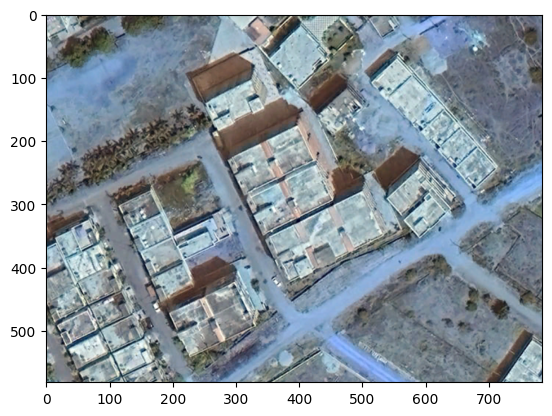

In [105]:
plt.imshow(image)

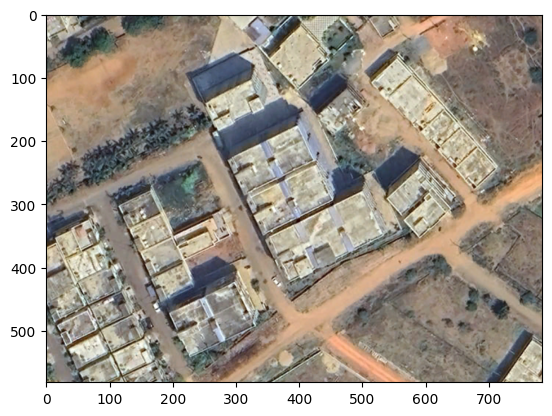

In [106]:
im=cv.cvtColor(image,cv.COLOR_BGR2RGB)
plt.imshow(im)

Removing The Noise

In [5]:
image_gauss=cv.GaussianBlur(im,(5,5),1)

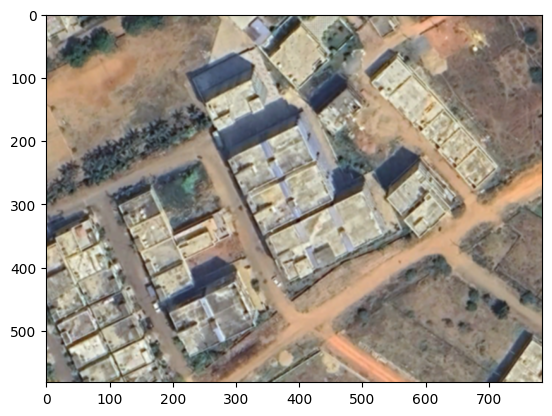

In [6]:
plt.imshow(image_gauss)

Sharpening The Image

In [7]:
image_sharpened=cv.addWeighted(im,0.5,image_gauss,0.5,3)

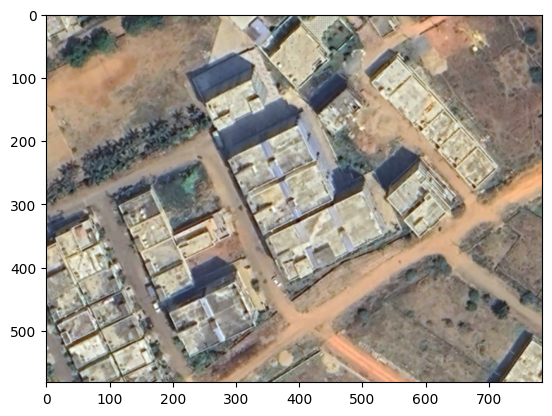

In [8]:
plt.imshow(image_sharpened)

GrayScale Image

In [9]:
image_gray=cv.cvtColor(im,cv.COLOR_BGR2GRAY)

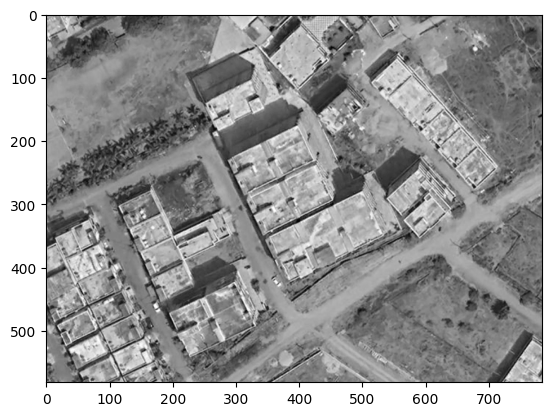

In [10]:
plt.imshow(image_gray,cmap='gray')

Detecting Edges

In [11]:
image_edged=cv.Canny(image_gray,100,200)

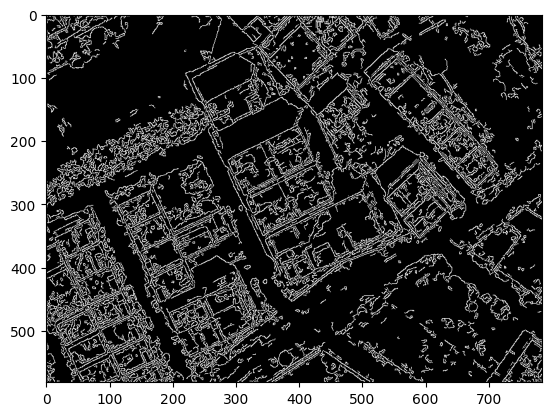

In [12]:
plt.imshow(image_edged,cmap='gray')

 Morphological Image Processing

In [13]:
kernel=cv.getStructuringElement(cv.MORPH_RECT,(5,5))
image_binary=cv.threshold(image_gray,180,155,cv.THRESH_BINARY)

In [14]:
image_eroded=cv.erode(image,kernel)

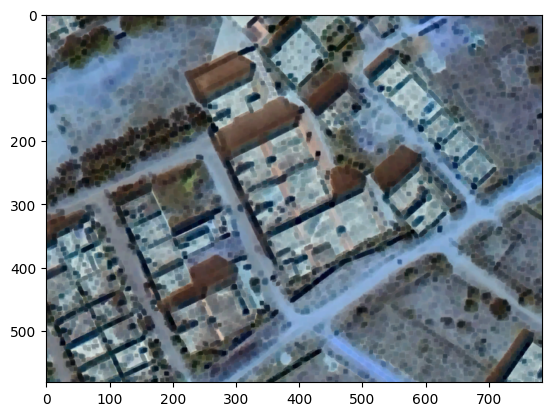

In [15]:
plt.imshow(image_eroded,cmap='gray')

In [16]:
image_dilated=cv.dilate(image_eroded,kernel)

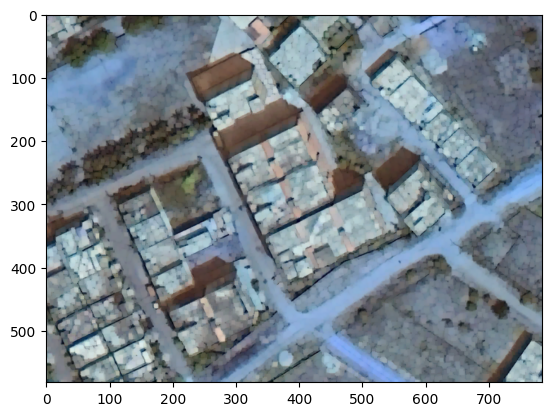

In [17]:
plt.imshow(image_dilated)

Display Function for plotting


In [18]:
def display_ims(image1,image2,image3,title1="Eroded",title2="Dilated",title3="Original"):

    plt.figure(figsize=(20,10))

    # image1_rgb=cv.cvtColor(image1,cv.COLOR_GRAY2BGR)
    # image2_rgb=cv.cvtColor(image2,cv.COLOR_GRAY2RGB) 
    
    plt.subplot(1, 3, 1)
    plt.imshow(image1)
    plt.title(title1)
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(image2)
    plt.title(title2)
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(image2)
    plt.title(title3)
    plt.axis('off')

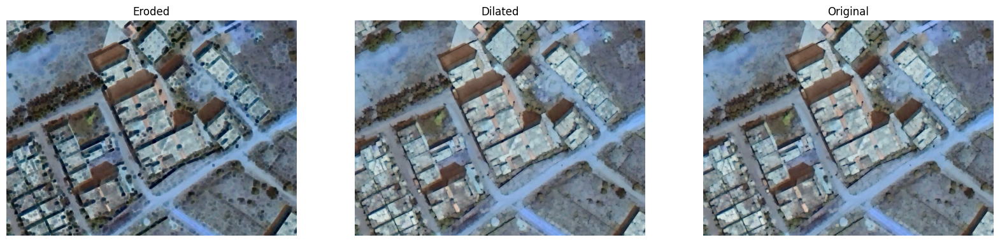

In [19]:
display_ims(image_eroded,image_dilated,im)

Applying kernel without CV2

In [20]:
from PIL import Image

In [21]:
def apply_kernel(image,kernel):
    image=Image.open(image).convert('L')
    image_array=np.array(image)
    image_height,image_width=image_array.shape
    kernel_height,kernel_width=kernel.shape
    pad_height=kernel_height//2
    pad_width=kernel_width//2
    padded_image=np.pad(image_array,((pad_height,pad_height),(pad_width,pad_width)))
    output_array=np.zeros_like(image_array)
    for i in range(image_height):
        for j in range(image_width):
            region=padded_image[i:i+kernel_height,j:j+kernel_width]
            output_value=np.sum(region*kernel)
            output_array[i,j]=output_value
    output_image=Image.fromarray(output_array)
    return output_image

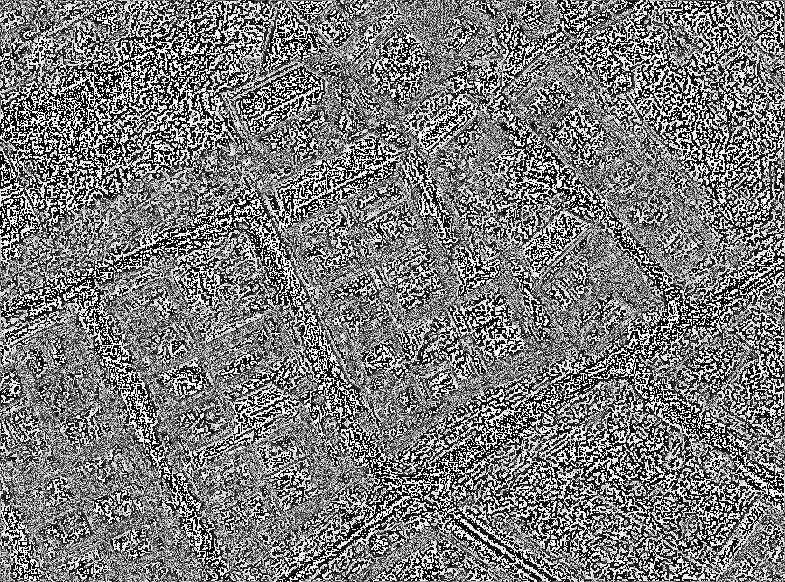

In [22]:
kernel=np.array([   [-1,-1,-1],
                    [-1,8,-1],
                    [-1,-1,-1]
                ])
apply_kernel(image_path,kernel)

In [23]:
image_array=np.array(image)
image_array.shape

(582, 785, 3)

In [24]:
image_eroded1=cv.erode(image,kernel)

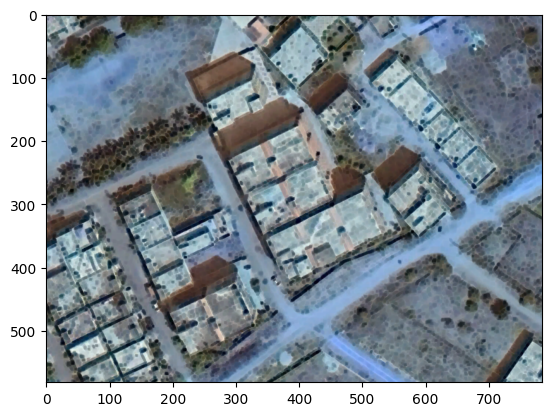

In [25]:
plt.imshow(image_eroded1)

In [26]:
image_dilated1=cv.dilate(image,kernel)

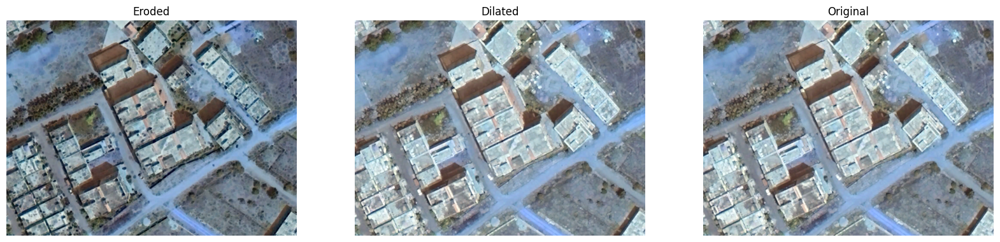

In [27]:
#imageee=Image.fromarray(image_dilated1,'RGB')
display_ims(image_eroded1,image_dilated1,image)

Morphological Gradient

In [28]:
gradient=cv.morphologyEx(image,cv.MORPH_GRADIENT,kernel)

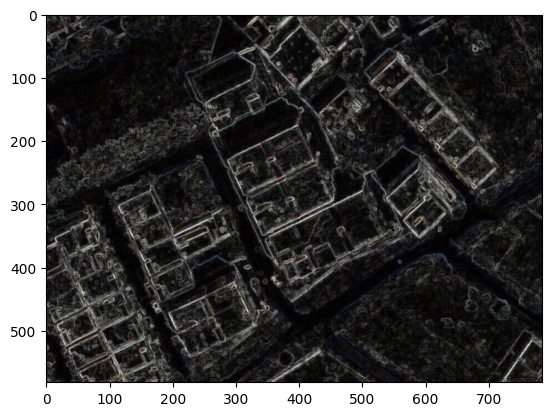

In [29]:
plt.imshow(gradient)

Morphological Tophat Operation


In [30]:
tophat=cv.morphologyEx(image,cv.MORPH_TOPHAT,kernel)

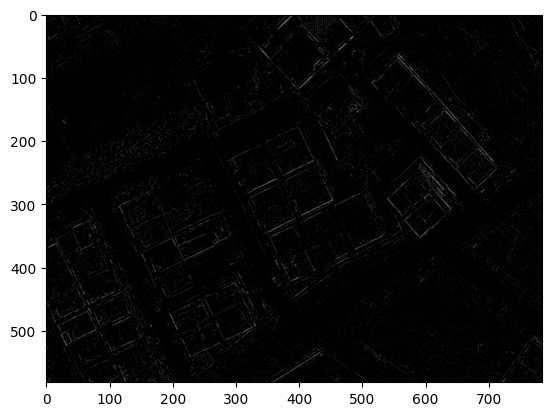

In [31]:
plt.imshow(tophat)

Morphological BlackHat operation

In [32]:
blackhat=cv.morphologyEx(image,cv.MORPH_BLACKHAT,kernel)

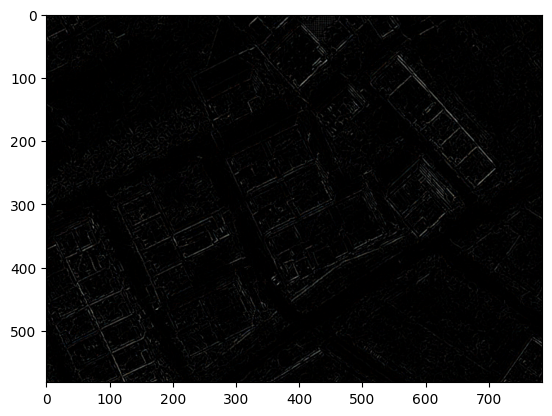

In [33]:
plt.imshow(blackhat)

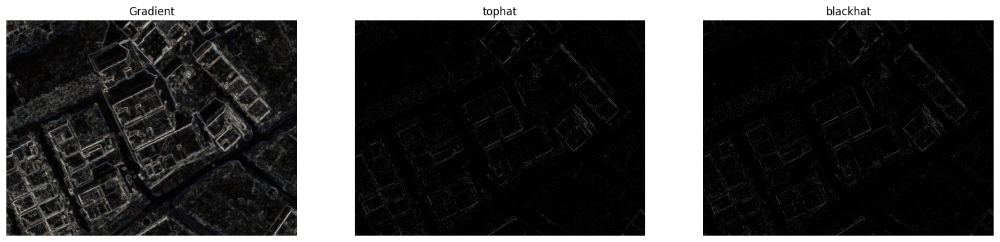

In [34]:
display_ims(gradient,tophat,blackhat,title3="blackhat",title2="tophat",title1="Gradient",)

Morphological Opening Operation

In [35]:
image_morph_open=cv.morphologyEx(image,cv.MORPH_OPEN,kernel)

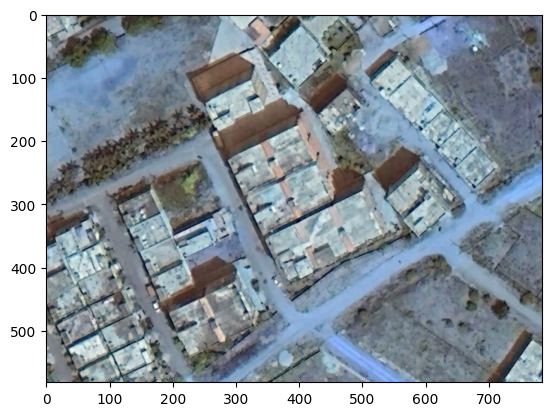

In [36]:
plt.imshow(image_morph_open)

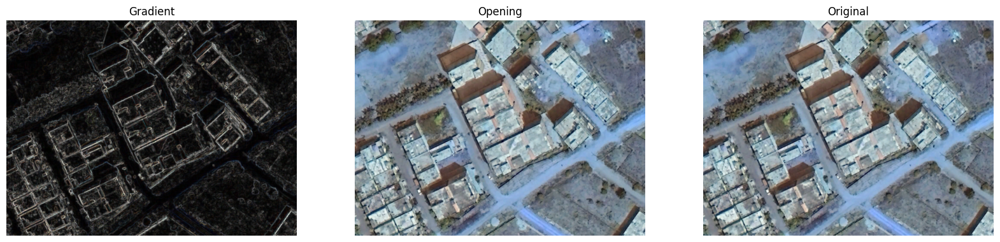

In [37]:
display_ims(gradient,image_morph_open,image,title3="Original",title2="Opening",title1="Gradient",)

Adding Noise

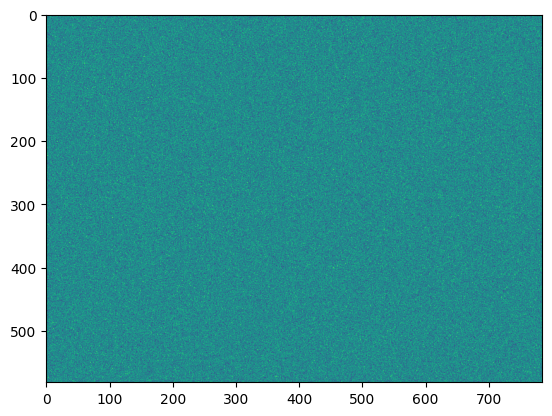

In [38]:
x,y=image.shape[:2]
mean=0
var=0.01
sigma=np.sqrt(var)
n=np.random.normal(loc=mean,scale=sigma,size=(x,y))
plt.imshow(n)

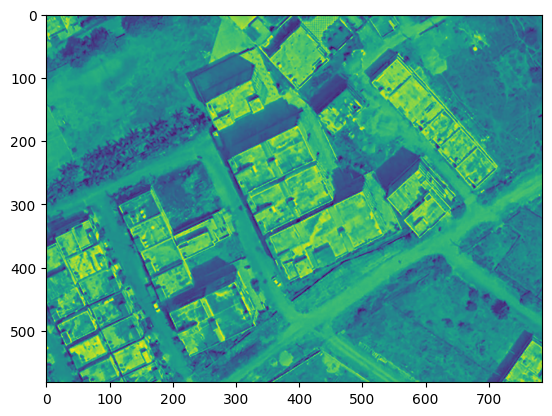

In [39]:
f=image_gray/255
plt.imshow(f)

Adding GrayScale image with Noise

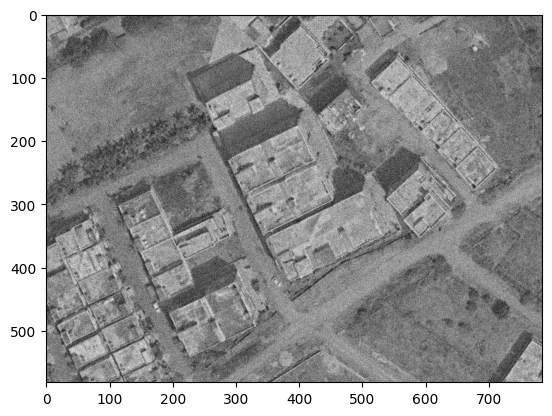

In [40]:
a=f+n
plt.imshow(a,cmap='gray')

DeNoising the Image

In [62]:
dst = cv.fastNlMeansDenoisingColored(image,10,10,7,21)

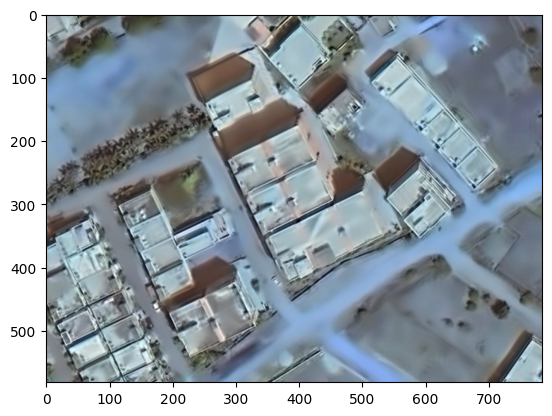

In [65]:
plt.imshow(dst)

Object Detection By Template Matching


In [91]:
template_path=r"C:\Users\Azista Industries\OneDrive\Desktop\Task\Images\Elrtemplate.png"
template=cv.imread(template_path,cv.IMREAD_GRAYSCALE)
w,h=template.shape[1],template.shape[0]

In [92]:
result=cv.matchTemplate(image_gray,template,cv.TM_CCOEFF_NORMED)

In [99]:
threshold=0.5
loc=np.where(result>=threshold)
for i in zip(*loc[::-1]):
    cv.rectangle(im,i,(i[0]+w,i[1]+h),(0,255,0),1)



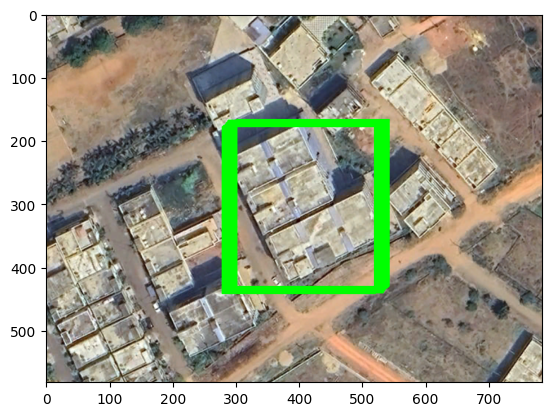

In [100]:
plt.imshow(im)

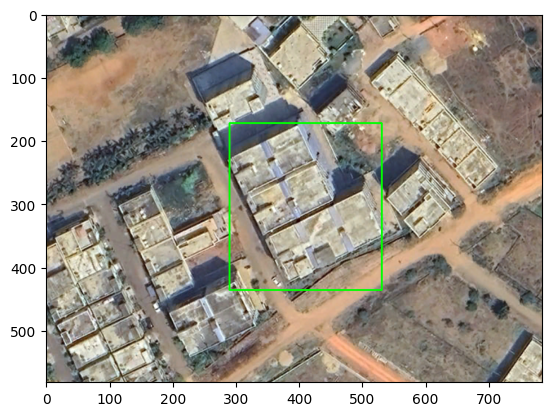

In [98]:
min_val,max_val,min_loc,max_loc=cv.minMaxLoc(result)
top_left=max_loc
bottom_right=top_left[0]+w,top_left[1]+h
cv.rectangle(im,top_left,bottom_right,(0,255,0),2)
plt.imshow(im)

FOUND A BUG IN OPENCV's cv.rectangle method. As the above 2 sections are for object detection, when the "Template matching" technique is used, the box bounding the object had been drawn regardless of the thickness.

In [153]:
upper = 175
lower = 450
left = 290
right =550
array_sq = np.copy(im)
array_sq[upper:lower, left:right, 0] = 0

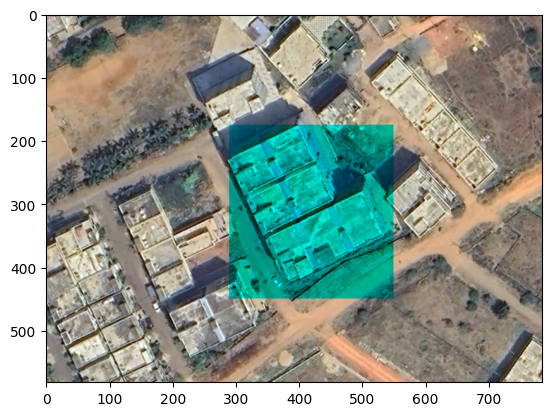

In [154]:
plt.imshow(array_sq)